<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Experiments-&amp;-Dataframes" data-toc-modified-id="Experiments-&amp;-Dataframes-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Experiments &amp; Dataframes</a></span></li><li><span><a href="#Preparations" data-toc-modified-id="Preparations-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Preparations</a></span><ul class="toc-item"><li><span><a href="#Importing-Libraries" data-toc-modified-id="Importing-Libraries-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Importing Libraries</a></span></li></ul></li><li><span><a href="#Generations-(2-experiments)" data-toc-modified-id="Generations-(2-experiments)-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Generations (2 experiments)</a></span><ul class="toc-item"><li><span><a href="#TVAE_durations_2" data-toc-modified-id="TVAE_durations_2-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span><font color="blue">TVAE_durations_2</font></a></span></li><li><span><a href="#GC_durations_2-(5k-Rows)" data-toc-modified-id="GC_durations_2-(5k-Rows)-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span><font color="Red">GC_durations_2 (5k Rows)</font></a></span></li></ul></li><li><span><a href="#Evaluations" data-toc-modified-id="Evaluations-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Evaluations</a></span><ul class="toc-item"><li><span><a href="#Diversity-Assessment" data-toc-modified-id="Diversity-Assessment-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span><font color="Purple">Diversity Assessment</font></a></span></li><li><span><a href="#Statistical-Assessment" data-toc-modified-id="Statistical-Assessment-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span><font color="Purple">Statistical Assessment</font></a></span></li><li><span><a href="#Fidelity-Assessment-(discriminative-score)" data-toc-modified-id="Fidelity-Assessment-(discriminative-score)-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span><font color="Purple">Fidelity Assessment (discriminative score)</font></a></span></li><li><span><a href="#Utility" data-toc-modified-id="Utility-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span><font color="Purple">Utility</font></a></span><ul class="toc-item"><li><span><a href="#TVAE_durations_2-(remove->2h-delay)" data-toc-modified-id="TVAE_durations_2-(remove->2h-delay)-4.4.1"><span class="toc-item-num">4.4.1&nbsp;&nbsp;</span><font color="Blue">TVAE_durations_2 (remove &gt;2h delay)</font></a></span><ul class="toc-item"><li><span><a href="#Arrival-ΔT-(min)" data-toc-modified-id="Arrival-ΔT-(min)-4.4.1.1"><span class="toc-item-num">4.4.1.1&nbsp;&nbsp;</span><code>Arrival ΔT (min)</code></a></span></li><li><span><a href="#Departure-ΔT-(min)" data-toc-modified-id="Departure-ΔT-(min)-4.4.1.2"><span class="toc-item-num">4.4.1.2&nbsp;&nbsp;</span><code>Departure ΔT (min)</code></a></span></li></ul></li><li><span><a href="#GC_durations_2-(remove->2h-delay)" data-toc-modified-id="GC_durations_2-(remove->2h-delay)-4.4.2"><span class="toc-item-num">4.4.2&nbsp;&nbsp;</span><font color="Red">GC_durations_2 (remove &gt;2h delay)</font></a></span><ul class="toc-item"><li><span><a href="#Arrival-ΔT-(min)" data-toc-modified-id="Arrival-ΔT-(min)-4.4.2.1"><span class="toc-item-num">4.4.2.1&nbsp;&nbsp;</span><code>Arrival ΔT (min)</code></a></span></li><li><span><a href="#Departure-ΔT-(min)" data-toc-modified-id="Departure-ΔT-(min)-4.4.2.2"><span class="toc-item-num">4.4.2.2&nbsp;&nbsp;</span><code>Departure ΔT (min)</code></a></span></li></ul></li></ul></li></ul></li></ul></div>

# Experiments & Dataframes
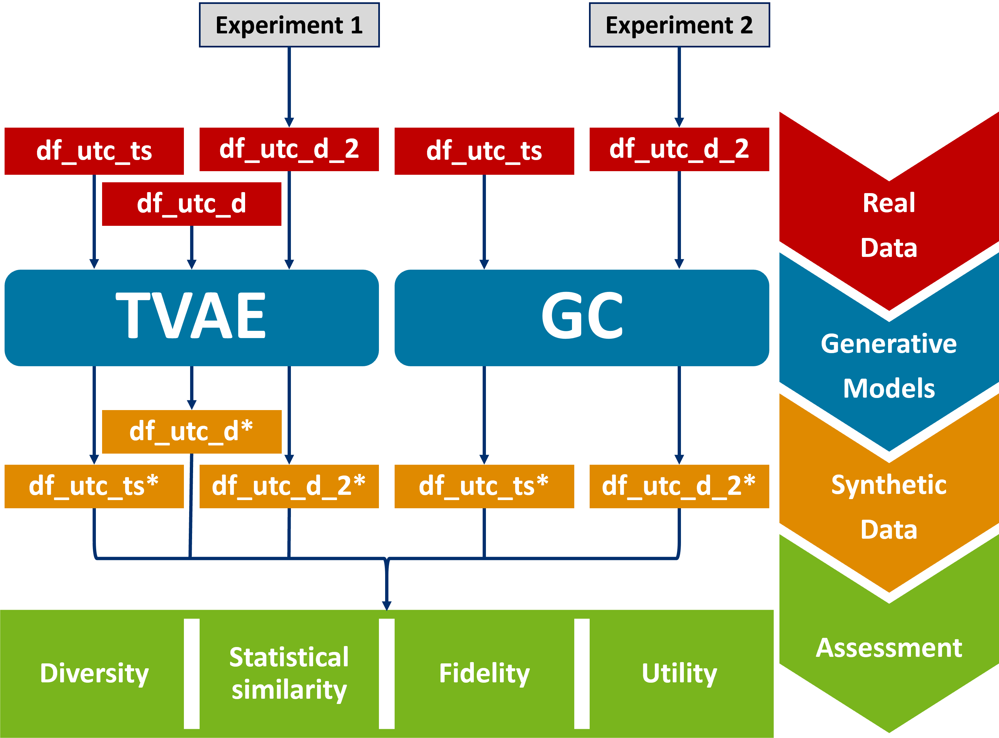


# Preparations

## Importing Libraries

In [1]:
# Import necessary libraries
import pickle
import numpy as np
import pandas as pd
from math import sqrt, ceil
from tabulate import tabulate
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Classification and regression models
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, make_scorer, f1_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# Generative models and evaluation metrics
from sdv.metadata import Metadata
from sdv.single_table import GaussianCopulaSynthesizer, TVAESynthesizer
from sdv.evaluation.single_table import run_diagnostic, evaluate_quality, get_column_plot, get_column_pair_plot

# Add path to graphviz that was installed manually
import os
os.environ["PATH"] += os.pathsep + r"C:\Users\kaly\Graphviz\bin"

In [2]:
# Class for terminal text colors and styles
class color:
   PURPLE = '\033[95m'    # Purple text
   CYAN = '\033[96m'      # Cyan text
   DARKCYAN = '\033[36m'  # Dark cyan text
   BLUE = '\033[94m'      # Blue text
   GREEN = '\033[92m'     # Green text
   YELLOW = '\033[93m'    # Yellow text
   RED = '\033[91m'       # Red text
   BOLD = '\033[1m'       # Bold text
   UNDERLINE = '\033[4m'  # Underlined text
   END = '\033[0m'        # Reset to default style

# Generations (2 experiments)

## <font color = 'blue'>TVAE_durations_2</font>


**Same as ``2_UC2-FlightDelayPrediction.ipynb``**

## <font color = 'Red'>GC_durations_2 (5k Rows)</font>


**Same as ``2_UC2-FlightDelayPrediction.ipynb``**

# Evaluations

## <font color = 'Purple'>Diversity Assessment</font>

**Same as ``2_UC2-FlightDelayPrediction.ipynb``**

## <font color = 'Purple'>Statistical Assessment</font>

**Same as ``2_UC2-FlightDelayPrediction.ipynb``**

## <font color = 'Purple'>Fidelity Assessment (discriminative score)</font>

**Same as ``2_UC2-FlightDelayPrediction.ipynb``**

## <font color = 'Purple'>Utility</font>


<div class="alert alert-info">
    
<b> Prediction of ``Departure ΔT (min)`` and ``Arrival ΔT (min)`` then use to calculate the ``Scheduled Departure Time UTC`` and ``Scheduled Arrival Time UTC``: </b>

|    | Features                     | Type                      | Keep/remove/encode                                          |
| :- | :--------------------------- | :------------------------ | :-----------------------------------------------------------|
| 1  | Unique Carrier Code          | non_numeric (categorical) | **<font color="Green">✔ (encode categorical ⌛)</font>**   |
| 2  | Tail Number                  | non_numeric (categorical) | **<font color="Green">✔ (encode categorical ⌛)</font>**   |
| 3  | Origin Airport ID            | numeric (categorical)     | **<font color="Red">✘ (misunderstood as numerical)</font>** |
| 4  | ICAO Origin Airport          | non_numeric (categorical) | **<font color="Green">✔ (encode categorical ⌛)</font>**   |
| 5  | Origin City                  | non_numeric (categorical) | **<font color="Red">✘ (redundant info)</font>**             |
| 6  | Origin State Code            | non_numeric (categorical) | **<font color="Red">✘ (redundant info)</font>**             |
| 7  | Origin State Name            | non_numeric (categorical) | **<font color="Red">✘ (redundant info)</font>**             |
| 8  | Destination Airport ID       | numeric (categorical)     | **<font color="Red">✘ (misunderstood as numerical)</font>** |
| 9  | ICAO Destination Airport     | non_numeric (categorical) | **<font color="Green">✔ (encode categorical ⌛)</font>**   |
| 10 | Destination City             | non_numeric (categorical) | **<font color="Red">✘ (redundant info)</font>**             |
| 11 | Destination State Code       | non_numeric (categorical) | **<font color="Red">✘ (redundant info)</font>**             |
| 12 | Destination State Name       | non_numeric (categorical) | **<font color="Red">✘ (redundant info)</font>**             |
| 13 | Quarter                      | numeric                   | **<font color="Green">✔</font>**                           |
| 14 | Day of Week                  | numeric                   | **<font color="Green">✔</font>**                           |
| 15 | Scheduled Departure Time UTC | non_numeric (datetime)    | **<font color="Blue">calculated</font>**                    |
| 16 | Actual Departure Time UTC    | non_numeric (datetime)    | **<font color="Green">✔ (encode datetime ⌛)</font>**      |
| 17 | Departure ΔT (min)           | numeric                   | **<font color="Blue">✔ (label)</font>**                    |
| 18 | Departure Delay Label        | numeric (categorical)     | **<font color="Red">✘ (on purpose)</font>**                 |
| 19 | Taxi Out Time (min)          | numeric                   | **<font color="Green">✔</font>**                           |
| 20 | Wheels Off Time UTC          | non_numeric (datetime)    | **<font color="Green">✔ (encode datetime ⌛)</font>**      |
| 21 | Wheels On Time UTC           | non_numeric (datetime)    | **<font color="Green">✔ (encode datetime ⌛)</font>**      |
| 22 | Taxi In Time (min)           | numeric                   | **<font color="Green">✔</font>**                           |
| 23 | Scheduled Arrival Time UTC   | non_numeric (datetime)    | **<font color="Blue">calculated</font>**                 |
| 24 | Actual Arrival Time UTC      | non_numeric (datetime)    | **<font color="Green">✔ (encode datetime ⌛)</font>** |
| 25 | Arrival ΔT (min)             | numeric                   | **<font color="Blue">✔ (label)</font>**                    |
| 26 | Arrival Delay Label          | numeric (categorical)     | **<font color="Red">✘ (on purpose)</font>**                 |
| 27 | Scheduled Elapsed Time (min) | numeric                   | **<font color="Red">✘ (on purpose)</font>**                 |
| 28 | Actual Elapsed Time (min)    | numeric                   | **<font color="Green">✔</font>**                           |
| 29 | Air Time (min)               | numeric                   | **<font color="Green">✔</font>**                           |
| 30 | Distance (miles)             | numeric                   | **<font color="Green">✔</font>**                           |


</div>


In [3]:
def split_data(df0, test_size=0.2, random_state=None, shuffle=False):
    # Splitting real data
    X = df0.drop(columns=cols_to_drop)
    Y = df0[target_column]

    X_train, X_test, Y_train, Y_test = train_test_split(
        X, Y, test_size=test_size, shuffle=shuffle, random_state=random_state)
    return X_train, X_test, Y_train, Y_test


#==============================================================================
def errors(Y_test, Y_pred):
    rmse = sqrt(mean_squared_error(Y_test, Y_pred))
    mae = mean_absolute_error(Y_test, Y_pred)
    r2 = r2_score(Y_test, Y_pred)
    return rmse, mae, r2


#==============================================================================
def print_predictive_score(evaluations,
                           target_column,
                           print_table=False,
                           return_df=True):
    print("\n" + color.BOLD + color.PURPLE +
          "Predicting \"{}\"".format(target_column) + color.END + "\n")
    header = ["Model"]
    table_data = []
    for metric in evaluations[list(evaluations.keys())[0]]:
        header.append(metric.upper())
    for model, metrics in evaluations.items():
        row = [model]
        row.extend(metrics.values())
        table_data.append(row)

    df = pd.DataFrame(table_data, columns=header)
    df.set_index("Model", inplace=True)

    # Calculate averages and add as a new row
    avg_values = df.mean().to_frame().T
    avg_values.index = ["Average"]
    df = pd.concat([df, avg_values])

    if print_table:
        df_display = df.reset_index()
        # Add a new index column starting from 1
        df_display.index = df_display.index + 1
        print(
            tabulate(df_display,
                     headers=header,
                     tablefmt="grid",
                     showindex=True))

    if return_df:
        return df


#==============================================================================
def combine_evaluations(evaluations, evaluations_MA, evaluations_EMA):
    # Merge metrics from evaluations, evaluations_MA and evaluations_EMA
    evaluations_combined = {}

    for model, metrics in evaluations.items():
        evaluations_combined[model] = {}
        for metric, value in metrics.items():
            evaluations_combined[model][metric] = value
            ma_metric = f"{metric}_(MA)"
            evaluations_combined[model][ma_metric] = evaluations_MA[model][
                ma_metric]
            ema_metric = f"{metric}_(EMA)"
            evaluations_combined[model][ema_metric] = evaluations_EMA[model][
                ema_metric]
    return evaluations_combined


#==============================================================================
def plot_scatter(Y_test, predictions, evaluations, target_column, lines=False):
    i = 0
    l_min = min(np.min(np.concatenate(predictions)), Y_test.min())
    l_max = max(np.max(np.concatenate(predictions)), Y_test.max())
    l = [l_min, l_max]

    rows = ceil(len(predictions) / 3)
    plt.rc('font', size=16)
    fig, ax = plt.subplots(rows,
                           3,
                           sharex=True,
                           sharey=True,
                           figsize=(15, 5 * rows))
    fig.suptitle("Regression Models\n", fontsize=20, fontweight='bold')
    fig.supxlabel(f'Real {target_column}')
    fig.supylabel(f'Predicted {target_column}')

    ax = ax.flatten()
    for Y_pred in predictions:
        ax[i].set_title(list(evaluations.keys())[i])
        ax[i].scatter(Y_test, Y_pred)
        ax[i].plot(l,
                   l,
                   color='r',
                   linestyle='--',
                   linewidth=2,
                   label="real = pred")
        if lines:
            # Add vertical and horizontal lines at 120
            line = 120
            ax[i].axvline(line,
                          color='blue',
                          linestyle='--',
                          linewidth=2,
                          label="Y_test = {}".format(line))
            ax[i].axhline(line,
                          color='green',
                          linestyle='--',
                          linewidth=2,
                          label="Y_pred = {}".format(line))

        ax[i].legend()
        i += 1

    plt.tight_layout()
    plt.show()


#==============================================================================
def regressions(X_train, X_test, Y_train, Y_test, suffix=""):
    # Scale the features for models sensitive to feature scaling
    X_scaler = StandardScaler()
    X_train = X_scaler.fit_transform(X_train)
    X_test = X_scaler.transform(X_test)

    # Scale Y for models that require it
    Y_scaler = StandardScaler()
    Y_train_scaled = Y_scaler.fit_transform(Y_train.to_numpy().reshape(
        -1, 1)).flatten()
    Y_test_scaled = Y_scaler.transform(Y_test.to_numpy().reshape(-1,
                                                                 1)).flatten()

    # Define the models
    modelsDict = {
        'Linear Regression':
        LinearRegression(),
        'Ridge Regression':
        Ridge(),
        'Lasso Regression':
        Lasso(),
        'Elastic Net':
        ElasticNet(),
        'Decision Tree Regression':
        DecisionTreeRegressor(random_state=42),
        'Random Forest Regression':
        RandomForestRegressor(random_state=42),
        'Gradient Boosting Regression':
        GradientBoostingRegressor(random_state=42),
        'Extra Trees Regressor':
        ExtraTreesRegressor(random_state=42),
        'Support Vector Regression':
        SVR(),
        'k-Nearest Neighbours Regression':
        KNeighborsRegressor(),
        'Neural Network (MLP)':
        MLPRegressor(random_state=42, max_iter=500),
        'XGBoost Regression':
        XGBRegressor(random_state=42),
        'LightGBM Regression':
        LGBMRegressor(random_state=42, verbose=-1),
        'CatBoost Regression':
        CatBoostRegressor(random_state=42, verbose=0),
        'Principal Component Regression (PCR)':
        make_pipeline(PCA(n_components=min(X_train.shape[1], 10)),
                      LinearRegression()),
        'Partial Least Squares Regression (PLS)':
        PLSRegression(n_components=min(X_train.shape[1], 10))
    }

    # Collect predictions and evaluations
    predictions = []
    evaluations = {}
    for modelName, modelClass in modelsDict.items():
        # Scale Y for these models
        if modelName in ['Support Vector Regression', 'Neural Network (MLP)']:
            modelClass.fit(X_train, Y_train_scaled)
            Y_pred_scaled = modelClass.predict(X_test)
            Y_pred = Y_scaler.inverse_transform(Y_pred_scaled.reshape(
                -1, 1)).flatten()
        else:  # No scaling required for these models
            modelClass.fit(X_train, Y_train)
            Y_pred = modelClass.predict(X_test)

        rmse, mae, r2 = errors(Y_test, Y_pred)

        predictions.append(Y_pred)
        evaluations[modelName] = {
            "rmse{}".format(suffix): rmse,
            "mae{}".format(suffix): mae,
            "r2{}".format(suffix): r2
        }
    return predictions, evaluations

### <font color = 'Blue'>TVAE_durations_2 (remove >2h delay)</font>

#### ``Arrival ΔT (min)``

- **Load real and synthetic**
- **For all features ( do not exclude calculated features).**

In [4]:
# Load
real = pd.read_pickle(
    '../data/uc6_outputs/real_vs_synth/real_TVAE_durations_2.pkl')
synthetic = pd.read_pickle(
    '../data/uc6_outputs/real_vs_synth/synthetic_TVAE_durations_2.pkl')
#==============================================================================
# Removing invalid routs before predictions
print("Removing {} routs that are not in the real data.".format(
    synthetic[synthetic["Distance (miles)"].isna()].shape[0]))
synthetic = synthetic.dropna(subset=["Distance (miles)"])
#==============================================================================
# Remove rare flights delayed more than 2 hours
threshold = 120
print("Removing {} flights from real data (Arrival Delay > 2h).".format(
    real[real["Arrival ΔT (min)"] > threshold].shape[0]))
print("Removing {} flights from synthetic data (Arrival Delay > 2h).".format(
    synthetic[synthetic["Arrival ΔT (min)"] > threshold].shape[0]))
real = real[real["Arrival ΔT (min)"] <= threshold]
synthetic = synthetic[synthetic["Arrival ΔT (min)"] <= threshold]

print("Removing {} flights from real data (Departure Delay > 2h).".format(
    real[real["Departure ΔT (min)"] > threshold].shape[0]))
print("Removing {} flights from synthetic data (Departure Delay > 2h).".format(
    synthetic[synthetic["Departure ΔT (min)"] > threshold].shape[0]))
real = real[real["Departure ΔT (min)"] <= threshold]
synthetic = synthetic[synthetic["Departure ΔT (min)"] <= threshold]

Removing 8315 routs that are not in the real data.
Removing 2089 flights from real data (Arrival Delay > 2h).
Removing 831 flights from synthetic data (Arrival Delay > 2h).
Removing 243 flights from real data (Departure Delay > 2h).
Removing 496 flights from synthetic data (Departure Delay > 2h).


**Encode non-numeric features:**

In [5]:
# Encode categorical
categorical_columns = [
    "Unique Carrier Code", "Tail Number", "ICAO Origin Airport",
    "ICAO Destination Airport"
]
# 1. ordinal encoding (to handel unseen categories)
ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value',
                                 unknown_value=-1)
for col in categorical_columns:
    # Fit the encoder on real data (reshape column to 2D)
    real[col] = ordinal_encoder.fit_transform(real[[col]])
    # Transform the synthetic dataset using the same encoding
    synthetic[col] = ordinal_encoder.transform(synthetic[[col]])
#==============================================================================
# Encode datetime (convert timestamps to minutes since the Unix epoch)
datetime_columns = [
    "Scheduled Departure Time UTC", "Actual Departure Time UTC",
    "Wheels Off Time UTC", "Wheels On Time UTC", "Scheduled Arrival Time UTC",
    "Actual Arrival Time UTC"
]
# Convert to minutes same as duration features
for col in datetime_columns:
    real[col] = pd.to_datetime(
        real[col]).dt.tz_convert(None).astype('int64') // 10**9 // 60
    synthetic[col] = pd.to_datetime(
        synthetic[col]).dt.tz_convert(None).astype('int64') // 10**9 // 60
#==============================================================================
remove = [
    "Origin Airport ID", "Origin City", "Origin State Code",
    "Origin State Name", "Destination Airport ID", "Destination City",
    "Destination State Code", "Destination State Name",
    "Scheduled Departure Time UTC", "Departure Delay Label",
    "Scheduled Arrival Time UTC", "Arrival Delay Label",
    "Scheduled Elapsed Time (min)"
]

ground_truth = real[[
    "Scheduled Arrival Time UTC",
    "Actual Arrival Time UTC",
    "Arrival ΔT (min)",
    "Arrival Delay Label",
    "Scheduled Departure Time UTC",
    "Actual Departure Time UTC",
    "Departure ΔT (min)",
    "Departure Delay Label",
]]

real = real.drop(columns=remove)
synthetic = synthetic.drop(columns=remove)
#==============================================================================
# Check for non_ numeric columns
print("Non-numeric columns in real data: ",
      real.select_dtypes(exclude=[np.number]).columns.tolist())
print("Non-numeric columns in synthetic data: ",
      synthetic.select_dtypes(exclude=[np.number]).columns.tolist())

Non-numeric columns in real data:  []
Non-numeric columns in synthetic data:  []


**Training/testing datasets:**

In [6]:
cols_to_drop = ["Departure ΔT (min)", "Arrival ΔT (min)"]
target_column = "Arrival ΔT (min)"

# Real
X_train_real, X_test_real, Y_train_real, Y_test_real = split_data(
    real, test_size=0.2, random_state=42)

# Synthetic
X_train_synthetic = synthetic.drop(columns=cols_to_drop)
Y_train_synthetic = synthetic[target_column]

**Experiment_1 (TRTR)**

In [7]:
predictions_1, evaluations_1 = regressions(X_train_real, X_test_real,
                                           Y_train_real, Y_test_real)


Predicting "Arrival ΔT (min)"

+----+----------------------------------------+---------+---------+------------+
|    | Model                                  |    RMSE |     MAE |         R2 |
+====+========================================+=========+=========+============+
|  1 | Linear Regression                      | 23.5794 | 16.1536 |  0.245438  |
+----+----------------------------------------+---------+---------+------------+
|  2 | Ridge Regression                       | 23.5795 | 16.1537 |  0.245431  |
+----+----------------------------------------+---------+---------+------------+
|  3 | Lasso Regression                       | 23.8822 | 16.6177 |  0.225929  |
+----+----------------------------------------+---------+---------+------------+
|  4 | Elastic Net                            | 24.3481 | 17.181  |  0.195434  |
+----+----------------------------------------+---------+---------+------------+
|  5 | Decision Tree Regression               | 69.3795 | 56.0186 | -5.5327  

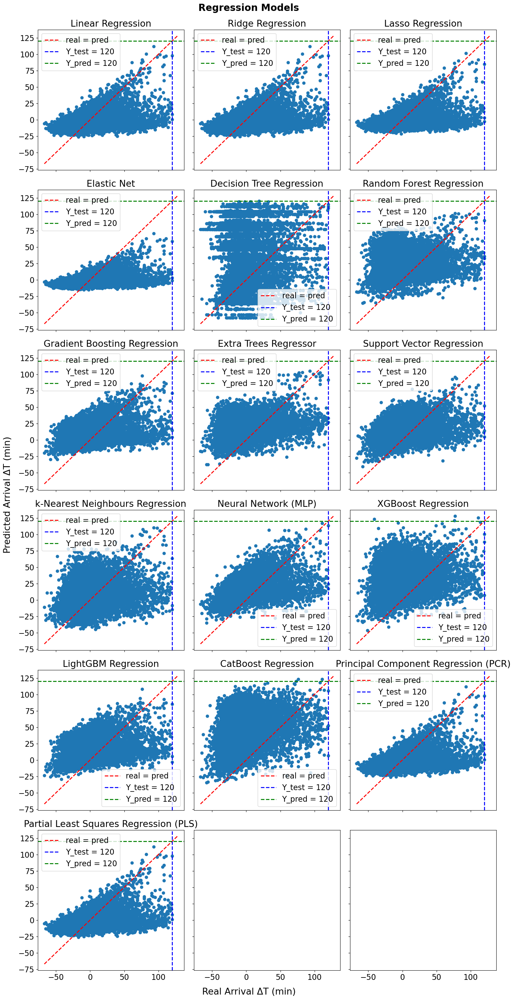

In [8]:
target_column = "Arrival ΔT (min)"
print_predictive_score(evaluations_1,
                       target_column,
                       print_table=True,
                       return_df=False)

predictions_1[-1] = predictions_1[-1].flatten()
plot_scatter(Y_test_real,
             predictions_1,
             evaluations_1,
             target_column,
             lines=True)

**Error ``Scheduled Arrival Time UTC``**

Before we calculated the error for the ***predicted*** ``Arrival ΔT (min)``, now we calculate:
* ***calculated*** ``Scheduled Arrival Time UTC`` = ***real*** ``Actual Arrival Time UTC`` + ***predicted*** ``Arrival ΔT (min)``
* Then we compare ***real*** vs ***calculated*** ``Scheduled Arrival Time UTC``.



Predicting "Scheduled Arrival Time (unix minutes)"

+----+----------------------------------------+---------+---------+----------+
|    | Model                                  |    RMSE |     MAE |       R2 |
+====+========================================+=========+=========+==========+
|  1 | Linear Regression                      | 35.419  | 27.5532 | 0.999795 |
+----+----------------------------------------+---------+---------+----------+
|  2 | Ridge Regression                       | 35.4187 | 27.5529 | 0.999795 |
+----+----------------------------------------+---------+---------+----------+
|  3 | Lasso Regression                       | 34.0978 | 26.3886 | 0.99981  |
+----+----------------------------------------+---------+---------+----------+
|  4 | Elastic Net                            | 31.8579 | 24.6743 | 0.999834 |
+----+----------------------------------------+---------+---------+----------+
|  5 | Decision Tree Regression               | 65.5423 | 55.5955 | 0.999297 |

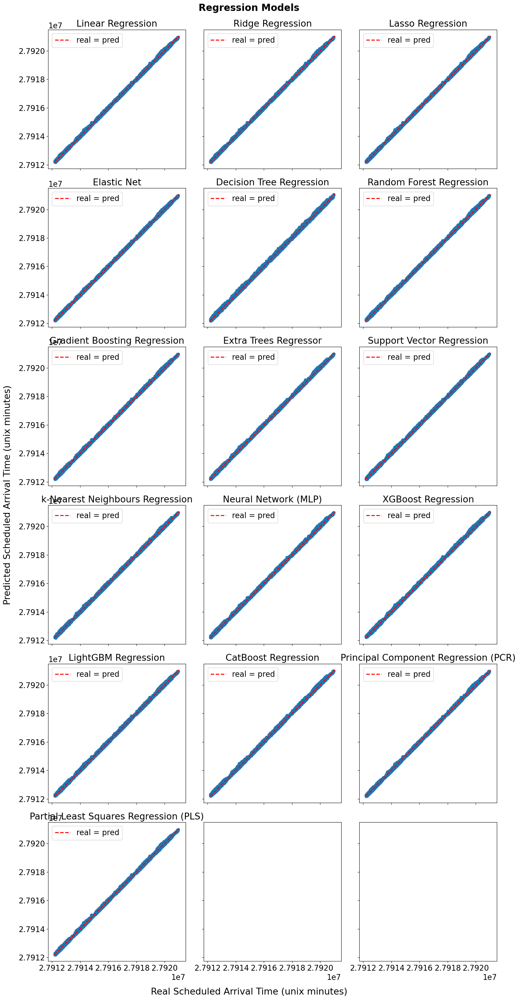

In [9]:
models = [
    'Linear Regression', 'Ridge Regression', 'Lasso Regression', 'Elastic Net',
    'Decision Tree Regression', 'Random Forest Regression',
    'Gradient Boosting Regression', 'Extra Trees Regressor',
    'Support Vector Regression', 'k-Nearest Neighbours Regression',
    'Neural Network (MLP)', 'XGBoost Regression', 'LightGBM Regression',
    'CatBoost Regression', 'Principal Component Regression (PCR)',
    'Partial Least Squares Regression (PLS)'
]

test_index = X_test_real.index
real_sched = ground_truth.loc[test_index]["Scheduled Arrival Time UTC"]

# Predicted Arrival ΔT (min) as np array
pred_arr_dT = np.array(predictions_1)
pred_sched = X_test_real["Actual Arrival Time UTC"].values + pred_arr_dT

evaluations = {}
for i in range(len(models)):
    rmse, mae, r2 = errors(real_sched, pred_sched[i])
    evaluations[models[i]] = {
        "rmse{}".format(""): rmse,
        "mae{}".format(""): mae,
        "r2{}".format(""): r2
    }

target_column = "Scheduled Arrival Time (unix minutes)"
print_predictive_score(evaluations,
                       target_column,
                       print_table=True,
                       return_df=False)
plot_scatter(real_sched, pred_sched, evaluations, target_column)

**Experiment_2 (TSTR)**

In [10]:
predictions_2, evaluations_2 = regressions(X_train_synthetic, X_test_real,
                                           Y_train_synthetic, Y_test_real)


Predicting "Arrival ΔT (min)"

+----+----------------------------------------+---------+---------+------------+
|    | Model                                  |    RMSE |     MAE |         R2 |
+====+========================================+=========+=========+============+
|  1 | Linear Regression                      | 23.9869 | 17.1509 |  0.219127  |
+----+----------------------------------------+---------+---------+------------+
|  2 | Ridge Regression                       | 23.987  | 17.1509 |  0.219125  |
+----+----------------------------------------+---------+---------+------------+
|  3 | Lasso Regression                       | 24.4313 | 17.8303 |  0.189928  |
+----+----------------------------------------+---------+---------+------------+
|  4 | Elastic Net                            | 24.9243 | 18.3738 |  0.156903  |
+----+----------------------------------------+---------+---------+------------+
|  5 | Decision Tree Regression               | 38.0846 | 27.3165 | -0.968474

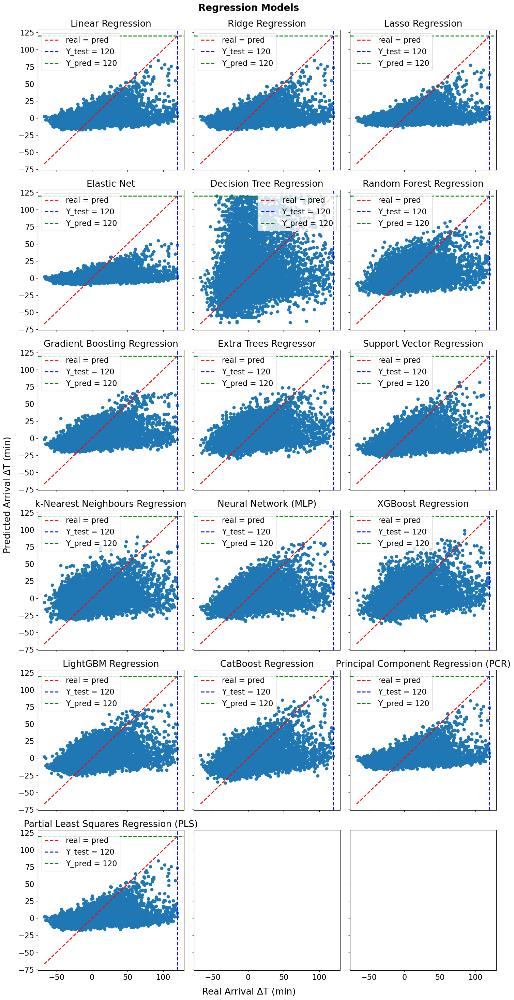

In [11]:
target_column = "Arrival ΔT (min)"
print_predictive_score(evaluations_2,
                       target_column,
                       print_table=True,
                       return_df=False)

predictions_2[-1] = predictions_2[-1].flatten()
plot_scatter(Y_test_real,
             predictions_2,
             evaluations_2,
             target_column,
             lines=True)

**Error ``Scheduled Arrival Time UTC``**

Before we calculated the error for the ***predicted*** ``Arrival ΔT (min)``, now we calculate:
* ***calculated*** ``Scheduled Arrival Time UTC`` = ***real*** ``Actual Arrival Time UTC`` + ***predicted*** ``Arrival ΔT (min)``
* Then we compare ***real*** vs ***calculated*** ``Scheduled Arrival Time UTC``.



Predicting "Scheduled Arrival Time (unix minutes)"

+----+----------------------------------------+---------+---------+----------+
|    | Model                                  |    RMSE |     MAE |       R2 |
+====+========================================+=========+=========+==========+
|  1 | Linear Regression                      | 32.9096 | 25.1785 | 0.999823 |
+----+----------------------------------------+---------+---------+----------+
|  2 | Ridge Regression                       | 32.9095 | 25.1784 | 0.999823 |
+----+----------------------------------------+---------+---------+----------+
|  3 | Lasso Regression                       | 31.8415 | 24.1463 | 0.999834 |
+----+----------------------------------------+---------+---------+----------+
|  4 | Elastic Net                            | 30.5239 | 23.1006 | 0.999847 |
+----+----------------------------------------+---------+---------+----------+
|  5 | Decision Tree Regression               | 46.7488 | 36.223  | 0.999642 |

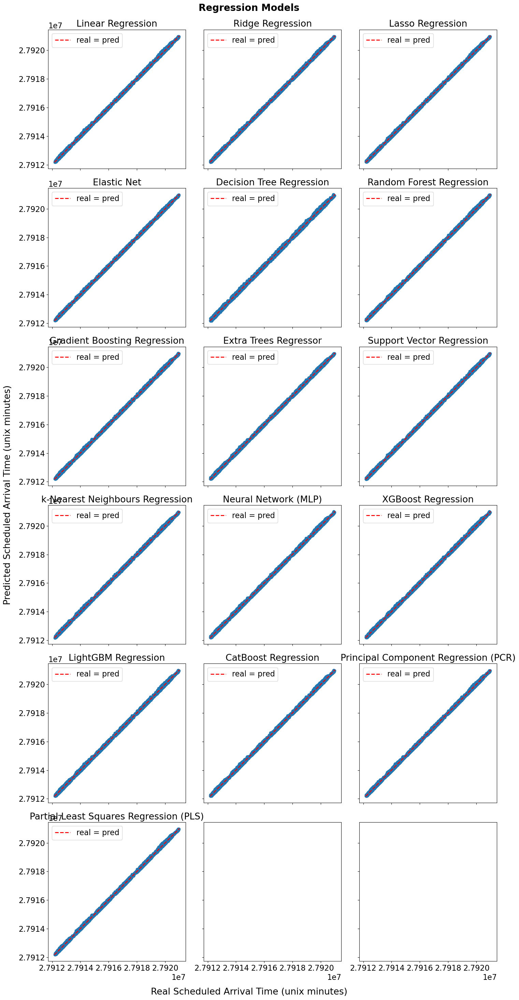

In [12]:
models = [
    'Linear Regression', 'Ridge Regression', 'Lasso Regression', 'Elastic Net',
    'Decision Tree Regression', 'Random Forest Regression',
    'Gradient Boosting Regression', 'Extra Trees Regressor',
    'Support Vector Regression', 'k-Nearest Neighbours Regression',
    'Neural Network (MLP)', 'XGBoost Regression', 'LightGBM Regression',
    'CatBoost Regression', 'Principal Component Regression (PCR)',
    'Partial Least Squares Regression (PLS)'
]

test_index = X_test_real.index
real_sched = ground_truth.loc[test_index]["Scheduled Arrival Time UTC"]

# Predicted Arrival ΔT (min) as np array
pred_arr_dT = np.array(predictions_2)
pred_sched = X_test_real["Actual Arrival Time UTC"].values + pred_arr_dT

evaluations = {}
for i in range(len(models)):
    rmse, mae, r2 = errors(real_sched, pred_sched[i])
    evaluations[models[i]] = {
        "rmse{}".format(""): rmse,
        "mae{}".format(""): mae,
        "r2{}".format(""): r2
    }

target_column = "Scheduled Arrival Time (unix minutes)"
print_predictive_score(evaluations,
                       target_column,
                       print_table=True,
                       return_df=False)
plot_scatter(real_sched, pred_sched, evaluations, target_column)

#### ``Departure ΔT (min)``

- **Load real and synthetic**
- **For all features ( do not exclude calculated features).**

In [13]:
# Load
real = pd.read_pickle(
    '../data/uc6_outputs/real_vs_synth/real_TVAE_durations_2.pkl')
synthetic = pd.read_pickle(
    '../data/uc6_outputs/real_vs_synth/synthetic_TVAE_durations_2.pkl')
#==============================================================================
# Removing invalid routs before predictions
print("Removing {} routs that are not in the real data.".format(
    synthetic[synthetic["Distance (miles)"].isna()].shape[0]))
synthetic = synthetic.dropna(subset=["Distance (miles)"])
#==============================================================================
# Remove rare flights delayed more than 2 hours
threshold = 120
print("Removing {} flights from real data (Arrival Delay > 2h).".format(
    real[real["Arrival ΔT (min)"] > threshold].shape[0]))
print("Removing {} flights from synthetic data (Arrival Delay > 2h).".format(
    synthetic[synthetic["Arrival ΔT (min)"] > threshold].shape[0]))
real = real[real["Arrival ΔT (min)"] <= threshold]
synthetic = synthetic[synthetic["Arrival ΔT (min)"] <= threshold]

print("Removing {} flights from real data (Departure Delay > 2h).".format(
    real[real["Departure ΔT (min)"] > threshold].shape[0]))
print("Removing {} flights from synthetic data (Departure Delay > 2h).".format(
    synthetic[synthetic["Departure ΔT (min)"] > threshold].shape[0]))
real = real[real["Departure ΔT (min)"] <= threshold]
synthetic = synthetic[synthetic["Departure ΔT (min)"] <= threshold]

Removing 8315 routs that are not in the real data.
Removing 2089 flights from real data (Arrival Delay > 2h).
Removing 831 flights from synthetic data (Arrival Delay > 2h).
Removing 243 flights from real data (Departure Delay > 2h).
Removing 496 flights from synthetic data (Departure Delay > 2h).


**Encode non-numeric features:**

In [14]:
# Encode categorical
categorical_columns = [
    "Unique Carrier Code", "Tail Number", "ICAO Origin Airport",
    "ICAO Destination Airport"
]
# 1. ordinal encoding (to handel unseen categories)
ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value',
                                 unknown_value=-1)
for col in categorical_columns:
    # Fit the encoder on real data (reshape column to 2D)
    real[col] = ordinal_encoder.fit_transform(real[[col]])
    # Transform the synthetic dataset using the same encoding
    synthetic[col] = ordinal_encoder.transform(synthetic[[col]])
#==============================================================================
# Encode datetime (convert timestamps to minutes since the Unix epoch)
datetime_columns = [
    "Scheduled Departure Time UTC", "Actual Departure Time UTC",
    "Wheels Off Time UTC", "Wheels On Time UTC", "Scheduled Arrival Time UTC",
    "Actual Arrival Time UTC"
]
# Convert to minutes same as duration features
for col in datetime_columns:
    real[col] = pd.to_datetime(
        real[col]).dt.tz_convert(None).astype('int64') // 10**9 // 60
    synthetic[col] = pd.to_datetime(
        synthetic[col]).dt.tz_convert(None).astype('int64') // 10**9 // 60
#==============================================================================
remove = [
    "Origin Airport ID", "Origin City", "Origin State Code",
    "Origin State Name", "Destination Airport ID", "Destination City",
    "Destination State Code", "Destination State Name",
    "Scheduled Departure Time UTC", "Departure Delay Label",
    "Scheduled Arrival Time UTC", "Arrival Delay Label",
    "Scheduled Elapsed Time (min)"
]

ground_truth = real[[
    "Scheduled Arrival Time UTC",
    "Actual Arrival Time UTC",
    "Arrival ΔT (min)",
    "Arrival Delay Label",
    "Scheduled Departure Time UTC",
    "Actual Departure Time UTC",
    "Departure ΔT (min)",
    "Departure Delay Label",
]]

real = real.drop(columns=remove)
synthetic = synthetic.drop(columns=remove)
#==============================================================================
# Check for non_ numeric columns
print("Non-numeric columns in real data: ",
      real.select_dtypes(exclude=[np.number]).columns.tolist())
print("Non-numeric columns in synthetic data: ",
      synthetic.select_dtypes(exclude=[np.number]).columns.tolist())

Non-numeric columns in real data:  []
Non-numeric columns in synthetic data:  []


**Training/testing datasets:**

In [15]:
cols_to_drop = ["Departure ΔT (min)", "Arrival ΔT (min)"]
target_column = "Departure ΔT (min)"

# Real
X_train_real, X_test_real, Y_train_real, Y_test_real = split_data(
    real, test_size=0.2, random_state=42)

# Synthetic
X_train_synthetic = synthetic.drop(columns=cols_to_drop)
Y_train_synthetic = synthetic[target_column]

**Experiment_1 (TRTR)**

In [16]:
predictions_3, evaluations_3 = regressions(X_train_real, X_test_real,
                                           Y_train_real, Y_test_real)


Predicting "Departure ΔT (min)"

+----+----------------------------------------+---------+---------+--------------+
|    | Model                                  |    RMSE |     MAE |           R2 |
+====+========================================+=========+=========+==============+
|  1 | Linear Regression                      | 21.5371 | 13.7327 |  0.00975501  |
+----+----------------------------------------+---------+---------+--------------+
|  2 | Ridge Regression                       | 21.5371 | 13.7327 |  0.00975318  |
+----+----------------------------------------+---------+---------+--------------+
|  3 | Lasso Regression                       | 21.6536 | 15.1397 | -0.000993043 |
+----+----------------------------------------+---------+---------+--------------+
|  4 | Elastic Net                            | 21.6017 | 14.6162 |  0.00380071  |
+----+----------------------------------------+---------+---------+--------------+
|  5 | Decision Tree Regression               | 61.03

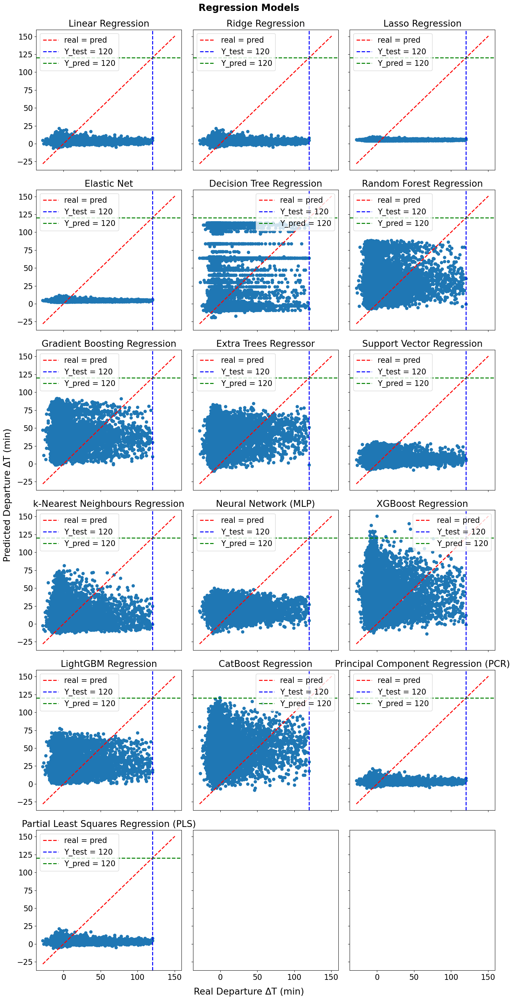

In [17]:
target_column = "Departure ΔT (min)"
print_predictive_score(evaluations_3,
                       target_column,
                       print_table=True,
                       return_df=False)

predictions_3[-1] = predictions_3[-1].flatten()
plot_scatter(Y_test_real,
             predictions_3,
             evaluations_3,
             target_column,
             lines=True)

**Error ``Scheduled Departure Time UTC``**

Before we calculated the error for the ***predicted*** ``Departure ΔT (min)``, now we calculate:
* ***calculated*** ``Scheduled Departure Time UTC`` = ***real*** ``Actual Departure Time UTC`` + ***predicted*** ``Departure ΔT (min)``
* Then we compare ***real*** vs ***calculated*** ``Scheduled Departure Time UTC``.



Predicting "Scheduled Departure Time (unix minutes)"

+----+----------------------------------------+---------+---------+----------+
|    | Model                                  |    RMSE |     MAE |       R2 |
+====+========================================+=========+=========+==========+
|  1 | Linear Regression                      | 23.1516 | 12.6263 | 0.999912 |
+----+----------------------------------------+---------+---------+----------+
|  2 | Ridge Regression                       | 23.1516 | 12.6262 | 0.999912 |
+----+----------------------------------------+---------+---------+----------+
|  3 | Lasso Regression                       | 23.6979 | 12.218  | 0.999908 |
+----+----------------------------------------+---------+---------+----------+
|  4 | Elastic Net                            | 23.35   | 12.1112 | 0.999911 |
+----+----------------------------------------+---------+---------+----------+
|  5 | Decision Tree Regression               | 65.647  | 51.1838 | 0.999295

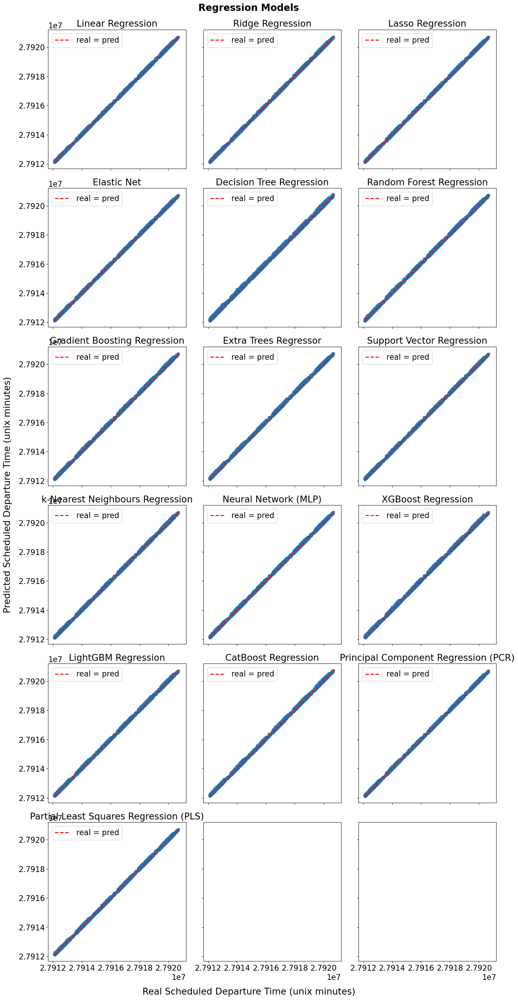

In [18]:
models = [
    'Linear Regression', 'Ridge Regression', 'Lasso Regression', 'Elastic Net',
    'Decision Tree Regression', 'Random Forest Regression',
    'Gradient Boosting Regression', 'Extra Trees Regressor',
    'Support Vector Regression', 'k-Nearest Neighbours Regression',
    'Neural Network (MLP)', 'XGBoost Regression', 'LightGBM Regression',
    'CatBoost Regression', 'Principal Component Regression (PCR)',
    'Partial Least Squares Regression (PLS)'
]

test_index = X_test_real.index
real_sched = ground_truth.loc[test_index]["Scheduled Departure Time UTC"]

# Predicted Departure ΔT (min) as np array
pred_dep_dT = np.array(predictions_3)
pred_sched = X_test_real["Actual Departure Time UTC"].values + pred_dep_dT

evaluations = {}
for i in range(len(models)):
    rmse, mae, r2 = errors(real_sched, pred_sched[i])
    evaluations[models[i]] = {
        "rmse{}".format(""): rmse,
        "mae{}".format(""): mae,
        "r2{}".format(""): r2
    }

target_column = "Scheduled Departure Time (unix minutes)"
print_predictive_score(evaluations,
                       target_column,
                       print_table=True,
                       return_df=False)
plot_scatter(real_sched, pred_sched, evaluations, target_column)

**Experiment_2 (TSTR)**

In [19]:
predictions_4, evaluations_4 = regressions(X_train_synthetic, X_test_real,
                                           Y_train_synthetic, Y_test_real)


Predicting "Departure ΔT (min)"

+----+----------------------------------------+---------+---------+-------------+
|    | Model                                  |    RMSE |     MAE |          R2 |
+====+========================================+=========+=========+=============+
|  1 | Linear Regression                      | 21.5447 | 14.4124 |  0.00904975 |
+----+----------------------------------------+---------+---------+-------------+
|  2 | Ridge Regression                       | 21.5447 | 14.4125 |  0.00904978 |
+----+----------------------------------------+---------+---------+-------------+
|  3 | Lasso Regression                       | 21.7311 | 15.4332 | -0.00816513 |
+----+----------------------------------------+---------+---------+-------------+
|  4 | Elastic Net                            | 21.6739 | 15.2145 | -0.00286948 |
+----+----------------------------------------+---------+---------+-------------+
|  5 | Decision Tree Regression               | 32.9046 | 20.424

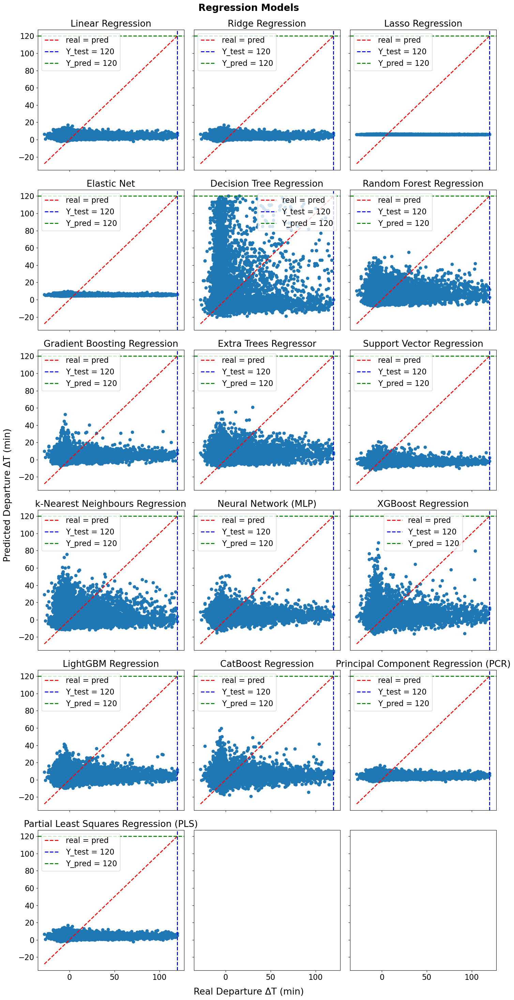

In [20]:
target_column = "Departure ΔT (min)"
print_predictive_score(evaluations_4,
                       target_column,
                       print_table=True,
                       return_df=False)

predictions_4[-1] = predictions_4[-1].flatten()
plot_scatter(Y_test_real,
             predictions_4,
             evaluations_4,
             target_column,
             lines=True)

**Error ``Scheduled Departure Time UTC``**

Before we calculated the error for the ***predicted*** ``Departure ΔT (min)``, now we calculate:
* ***calculated*** ``Scheduled Departure Time UTC`` = ***real*** ``Actual Departure Time UTC`` + ***predicted*** ``Departure ΔT (min)``
* Then we compare ***real*** vs ***calculated*** ``Scheduled Departure Time UTC``.



Predicting "Scheduled Departure Time (unix minutes)"

+----+----------------------------------------+---------+---------+----------+
|    | Model                                  |    RMSE |     MAE |       R2 |
+====+========================================+=========+=========+==========+
|  1 | Linear Regression                      | 23.4928 | 12.5343 | 0.99991  |
+----+----------------------------------------+---------+---------+----------+
|  2 | Ridge Regression                       | 23.4928 | 12.5342 | 0.99991  |
+----+----------------------------------------+---------+---------+----------+
|  3 | Lasso Regression                       | 23.8412 | 12.2446 | 0.999907 |
+----+----------------------------------------+---------+---------+----------+
|  4 | Elastic Net                            | 23.7395 | 12.2373 | 0.999908 |
+----+----------------------------------------+---------+---------+----------+
|  5 | Decision Tree Regression               | 35.1151 | 22.873  | 0.999798

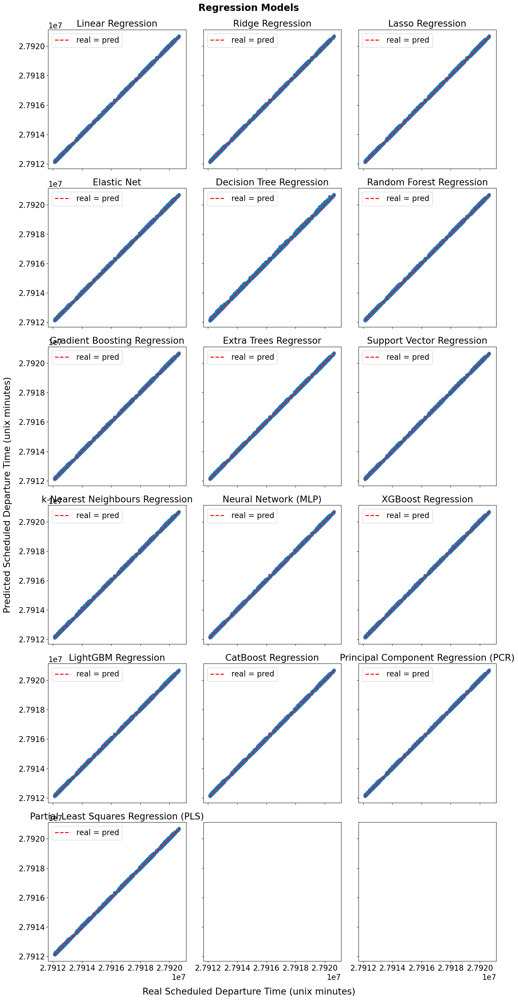

In [21]:
models = [
    'Linear Regression', 'Ridge Regression', 'Lasso Regression', 'Elastic Net',
    'Decision Tree Regression', 'Random Forest Regression',
    'Gradient Boosting Regression', 'Extra Trees Regressor',
    'Support Vector Regression', 'k-Nearest Neighbours Regression',
    'Neural Network (MLP)', 'XGBoost Regression', 'LightGBM Regression',
    'CatBoost Regression', 'Principal Component Regression (PCR)',
    'Partial Least Squares Regression (PLS)'
]

test_index = X_test_real.index
real_sched = ground_truth.loc[test_index]["Scheduled Departure Time UTC"]

# Predicted Departure ΔT (min) as np array
pred_dep_dT = np.array(predictions_4)
pred_sched = X_test_real["Actual Departure Time UTC"].values + pred_dep_dT

evaluations = {}
for i in range(len(models)):
    rmse, mae, r2 = errors(real_sched, pred_sched[i])
    evaluations[models[i]] = {
        "rmse{}".format(""): rmse,
        "mae{}".format(""): mae,
        "r2{}".format(""): r2
    }

target_column = "Scheduled Departure Time (unix minutes)"
print_predictive_score(evaluations,
                       target_column,
                       print_table=True,
                       return_df=False)
plot_scatter(real_sched, pred_sched, evaluations, target_column)

**Save evaluations for comparison:**

In [22]:
# Saving the dictionary to a file
with open(
        '../data/uc6_outputs/predictive_score/predictive_score_TVAE_trtr_Rem2h_ArrivalDelay.pkl',
        'wb') as f:
    pickle.dump(evaluations_1, f)
with open(
        '../data/uc6_outputs/predictive_score/predictive_score_TVAE_tstr_Rem2h_ArrivalDelay.pkl',
        'wb') as f:
    pickle.dump(evaluations_2, f)
with open(
        '../data/uc6_outputs/predictive_score/predictive_score_TVAE_trtr_Rem2h_DepartureDelay.pkl',
        'wb') as f:
    pickle.dump(evaluations_3, f)
with open(
        '../data/uc6_outputs/predictive_score/predictive_score_TVAE_tstr_Rem2h_DepartureDelay.pkl',
        'wb') as f:
    pickle.dump(evaluations_4, f)

### <font color = 'Red'>GC_durations_2 (remove >2h delay)</font>

<div class="alert alert-warning">
    
<b> The prediction of GC is worst: </b>

Because it used small part of the real data (only 5k rows) to generate 5k rows of synthetic data which after removing the invalid routs becomes even smaller (2k rows). As a result many flights are under represented in the synthetic data and can not be predicted very well.

</div>

#### ``Arrival ΔT (min)``

- **Load real and synthetic**
- **For all features ( do not exclude calculated features).**

In [23]:
# Load
real = pd.read_pickle(
    '../data/uc6_outputs/real_vs_synth/real_GC_durations_2.pkl')
synthetic = pd.read_pickle(
    '../data/uc6_outputs/real_vs_synth/synthetic_GC_durations_2.pkl')
#==============================================================================
# Removing invalid routs before predictions
print("Removing {} routs that are not in the real data.".format(
    synthetic[synthetic["Distance (miles)"].isna()].shape[0]))
synthetic = synthetic.dropna(subset=["Distance (miles)"])
#==============================================================================
# Remove rare flights delayed more than 2 hours
threshold = 120
print("Removing {} flights from real data (Arrival Delay > 2h).".format(
    real[real["Arrival ΔT (min)"] > threshold].shape[0]))
print("Removing {} flights from synthetic data (Arrival Delay > 2h).".format(
    synthetic[synthetic["Arrival ΔT (min)"] > threshold].shape[0]))
real = real[real["Arrival ΔT (min)"] <= threshold]
synthetic = synthetic[synthetic["Arrival ΔT (min)"] <= threshold]

print("Removing {} flights from real data (Departure Delay > 2h).".format(
    real[real["Departure ΔT (min)"] > threshold].shape[0]))
print("Removing {} flights from synthetic data (Departure Delay > 2h).".format(
    synthetic[synthetic["Departure ΔT (min)"] > threshold].shape[0]))
real = real[real["Departure ΔT (min)"] <= threshold]
synthetic = synthetic[synthetic["Departure ΔT (min)"] <= threshold]

Removing 2586 routs that are not in the real data.
Removing 304 flights from real data (Arrival Delay > 2h).
Removing 135 flights from synthetic data (Arrival Delay > 2h).
Removing 34 flights from real data (Departure Delay > 2h).
Removing 85 flights from synthetic data (Departure Delay > 2h).


**Encode non-numeric features:**

In [24]:
# Encode categorical
categorical_columns = [
    "Unique Carrier Code", "Tail Number", "ICAO Origin Airport",
    "ICAO Destination Airport"
]
# 1. ordinal encoding (to handel unseen categories)
ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value',
                                 unknown_value=-1)
for col in categorical_columns:
    # Fit the encoder on real data (reshape column to 2D)
    real[col] = ordinal_encoder.fit_transform(real[[col]])
    # Transform the synthetic dataset using the same encoding
    synthetic[col] = ordinal_encoder.transform(synthetic[[col]])
#==============================================================================
# Encode datetime (convert timestamps to minutes since the Unix epoch)
datetime_columns = [
    "Scheduled Departure Time UTC", "Actual Departure Time UTC",
    "Wheels Off Time UTC", "Wheels On Time UTC", "Scheduled Arrival Time UTC",
    "Actual Arrival Time UTC"
]
# Convert to minutes same as duration features
for col in datetime_columns:
    real[col] = pd.to_datetime(
        real[col]).dt.tz_convert(None).astype('int64') // 10**9 // 60
    synthetic[col] = pd.to_datetime(
        synthetic[col]).dt.tz_convert(None).astype('int64') // 10**9 // 60
#==============================================================================
remove = [
    "Origin Airport ID", "Origin City", "Origin State Code",
    "Origin State Name", "Destination Airport ID", "Destination City",
    "Destination State Code", "Destination State Name",
    "Scheduled Departure Time UTC", "Departure Delay Label",
    "Scheduled Arrival Time UTC", "Arrival Delay Label",
    "Scheduled Elapsed Time (min)"
]

ground_truth = real[[
    "Scheduled Arrival Time UTC",
    "Actual Arrival Time UTC",
    "Arrival ΔT (min)",
    "Arrival Delay Label",
    "Scheduled Departure Time UTC",
    "Actual Departure Time UTC",
    "Departure ΔT (min)",
    "Departure Delay Label",
]]

real = real.drop(columns=remove)
synthetic = synthetic.drop(columns=remove)
#==============================================================================
# Check for non_ numeric columns
print("Non-numeric columns in real data: ",
      real.select_dtypes(exclude=[np.number]).columns.tolist())
print("Non-numeric columns in synthetic data: ",
      synthetic.select_dtypes(exclude=[np.number]).columns.tolist())

Non-numeric columns in real data:  []
Non-numeric columns in synthetic data:  []


**Training/testing datasets:**

In [25]:
cols_to_drop = ["Departure ΔT (min)", "Arrival ΔT (min)"]
target_column = "Arrival ΔT (min)"

# Real
X_train_real, X_test_real, Y_train_real, Y_test_real = split_data(
    real, test_size=0.2, random_state=42)

# Synthetic
X_train_synthetic = synthetic.drop(columns=cols_to_drop)
Y_train_synthetic = synthetic[target_column]

**Experiment_1 (TRTR)**

In [26]:
predictions_5, evaluations_5 = regressions(X_train_real, X_test_real,
                                           Y_train_real, Y_test_real)


Predicting "Arrival ΔT (min)"

+----+----------------------------------------+---------+---------+-------------+
|    | Model                                  |    RMSE |     MAE |          R2 |
+====+========================================+=========+=========+=============+
|  1 | Linear Regression                      | 29.3046 | 23.0076 | -0.00222441 |
+----+----------------------------------------+---------+---------+-------------+
|  2 | Ridge Regression                       | 29.3045 | 23.0075 | -0.0022129  |
+----+----------------------------------------+---------+---------+-------------+
|  3 | Lasso Regression                       | 29.2385 | 23.0513 |  0.00229285 |
+----+----------------------------------------+---------+---------+-------------+
|  4 | Elastic Net                            | 29.2499 | 22.9327 |  0.00151607 |
+----+----------------------------------------+---------+---------+-------------+
|  5 | Decision Tree Regression               | 61.6932 | 46.4973 

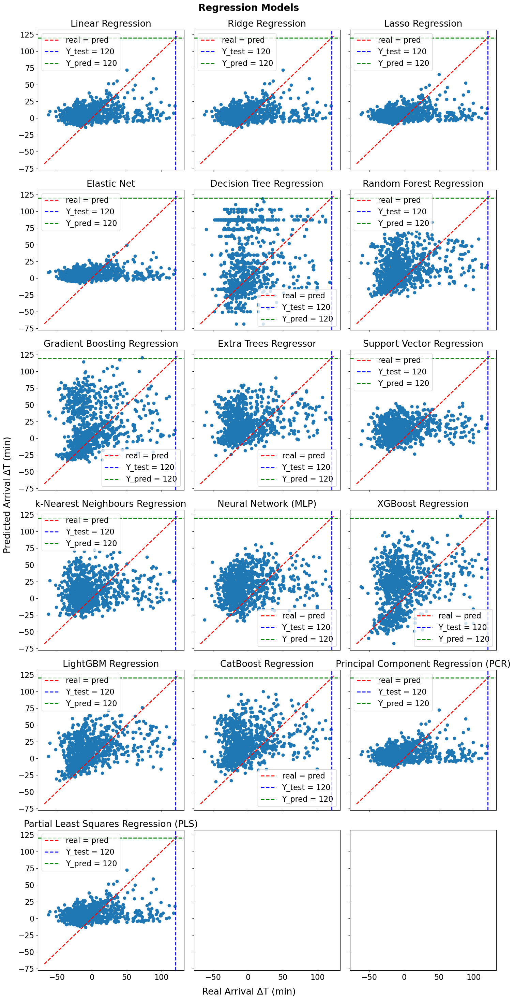

In [27]:
target_column = "Arrival ΔT (min)"
print_predictive_score(evaluations_5,
                       target_column,
                       print_table=True,
                       return_df=False)

predictions_5[-1] = predictions_5[-1].flatten()
plot_scatter(Y_test_real,
             predictions_5,
             evaluations_5,
             target_column,
             lines=True)

**Error ``Scheduled Arrival Time UTC``**

Before we calculated the error for the ***predicted*** ``Arrival ΔT (min)``, now we calculate:
* ***calculated*** ``Scheduled Arrival Time UTC`` = ***real*** ``Actual Arrival Time UTC`` + ***predicted*** ``Arrival ΔT (min)``
* Then we compare ***real*** vs ***calculated*** ``Scheduled Arrival Time UTC``.



Predicting "Scheduled Arrival Time (unix minutes)"

+----+----------------------------------------+---------+---------+----------+
|    | Model                                  |    RMSE |     MAE |       R2 |
+====+========================================+=========+=========+==========+
|  1 | Linear Regression                      | 33.7902 | 24.4314 | 0.99793  |
+----+----------------------------------------+---------+---------+----------+
|  2 | Ridge Regression                       | 33.789  | 24.4305 | 0.99793  |
+----+----------------------------------------+---------+---------+----------+
|  3 | Lasso Regression                       | 32.9795 | 23.6624 | 0.998028 |
+----+----------------------------------------+---------+---------+----------+
|  4 | Elastic Net                            | 31.9923 | 22.9963 | 0.998144 |
+----+----------------------------------------+---------+---------+----------+
|  5 | Decision Tree Regression               | 62.7936 | 50.7631 | 0.992851 |

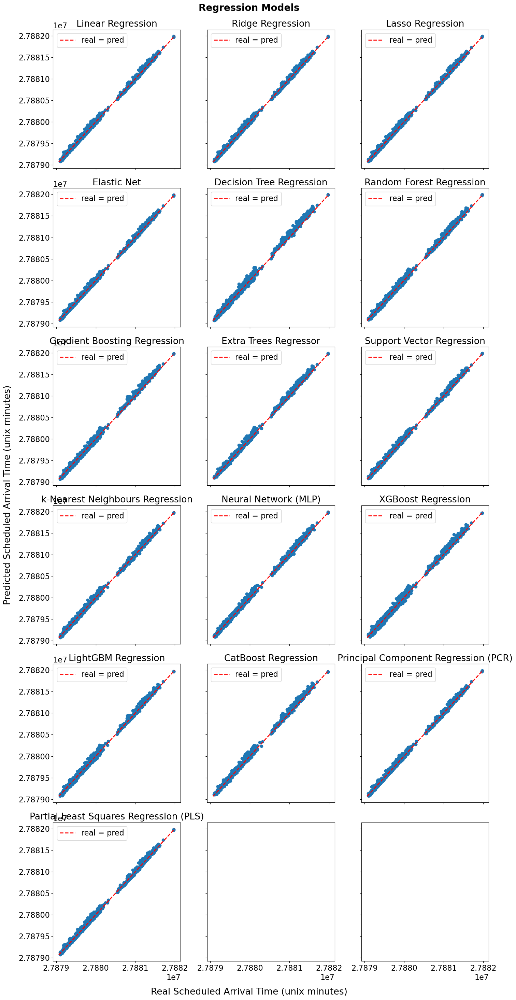

In [28]:
models = [
    'Linear Regression', 'Ridge Regression', 'Lasso Regression', 'Elastic Net',
    'Decision Tree Regression', 'Random Forest Regression',
    'Gradient Boosting Regression', 'Extra Trees Regressor',
    'Support Vector Regression', 'k-Nearest Neighbours Regression',
    'Neural Network (MLP)', 'XGBoost Regression', 'LightGBM Regression',
    'CatBoost Regression', 'Principal Component Regression (PCR)',
    'Partial Least Squares Regression (PLS)'
]

test_index = X_test_real.index
real_sched = ground_truth.loc[test_index]["Scheduled Arrival Time UTC"]

# Predicted Arrival ΔT (min) as np array
pred_arr_dT = np.array(predictions_5)
pred_sched = X_test_real["Actual Arrival Time UTC"].values + pred_arr_dT

evaluations = {}
for i in range(len(models)):
    rmse, mae, r2 = errors(real_sched, pred_sched[i])
    evaluations[models[i]] = {
        "rmse{}".format(""): rmse,
        "mae{}".format(""): mae,
        "r2{}".format(""): r2
    }

target_column = "Scheduled Arrival Time (unix minutes)"
print_predictive_score(evaluations,
                       target_column,
                       print_table=True,
                       return_df=False)
plot_scatter(real_sched, pred_sched, evaluations, target_column)

**Experiment_2 (TSTR)**

In [29]:
predictions_6, evaluations_6 = regressions(X_train_synthetic, X_test_real,
                                           Y_train_synthetic, Y_test_real)


Predicting "Arrival ΔT (min)"

+----+----------------------------------------+---------+---------+------------+
|    | Model                                  |    RMSE |     MAE |         R2 |
+====+========================================+=========+=========+============+
|  1 | Linear Regression                      | 28.3802 | 20.6291 |  0.0600067 |
+----+----------------------------------------+---------+---------+------------+
|  2 | Ridge Regression                       | 28.3808 | 20.6311 |  0.0599729 |
+----+----------------------------------------+---------+---------+------------+
|  3 | Lasso Regression                       | 28.4065 | 20.4624 |  0.058268  |
+----+----------------------------------------+---------+---------+------------+
|  4 | Elastic Net                            | 28.5309 | 20.7297 |  0.0500013 |
+----+----------------------------------------+---------+---------+------------+
|  5 | Decision Tree Regression               | 47.645  | 34.8371 | -1.64928 

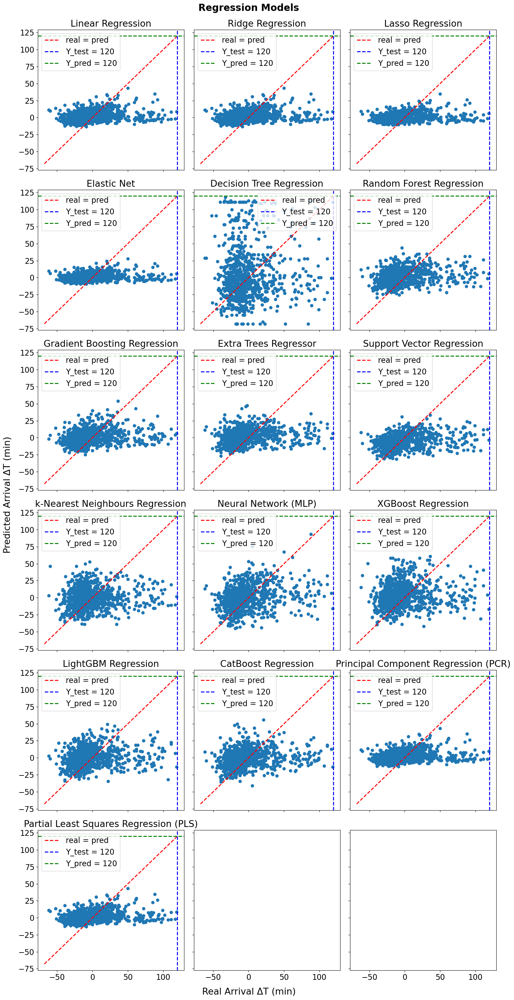

In [30]:
target_column = "Arrival ΔT (min)"
print_predictive_score(evaluations_6,
                       target_column,
                       print_table=True,
                       return_df=False)

predictions_6[-1] = predictions_6[-1].flatten()
plot_scatter(Y_test_real,
             predictions_6,
             evaluations_6,
             target_column,
             lines=True)

**Error ``Scheduled Arrival Time UTC``**

Before we calculated the error for the ***predicted*** ``Arrival ΔT (min)``, now we calculate:
* ***calculated*** ``Scheduled Arrival Time UTC`` = ***real*** ``Actual Arrival Time UTC`` + ***predicted*** ``Arrival ΔT (min)``
* Then we compare ***real*** vs ***calculated*** ``Scheduled Arrival Time UTC``.



Predicting "Scheduled Arrival Time (unix minutes)"

+----+----------------------------------------+---------+---------+----------+
|    | Model                                  |    RMSE |     MAE |       R2 |
+====+========================================+=========+=========+==========+
|  1 | Linear Regression                      | 32.2783 | 24.7651 | 0.998111 |
+----+----------------------------------------+---------+---------+----------+
|  2 | Ridge Regression                       | 32.2774 | 24.7631 | 0.998111 |
+----+----------------------------------------+---------+---------+----------+
|  3 | Lasso Regression                       | 31.4608 | 24.307  | 0.998205 |
+----+----------------------------------------+---------+---------+----------+
|  4 | Elastic Net                            | 31.0897 | 23.9116 | 0.998248 |
+----+----------------------------------------+---------+---------+----------+
|  5 | Decision Tree Regression               | 50.077  | 38.8028 | 0.995453 |

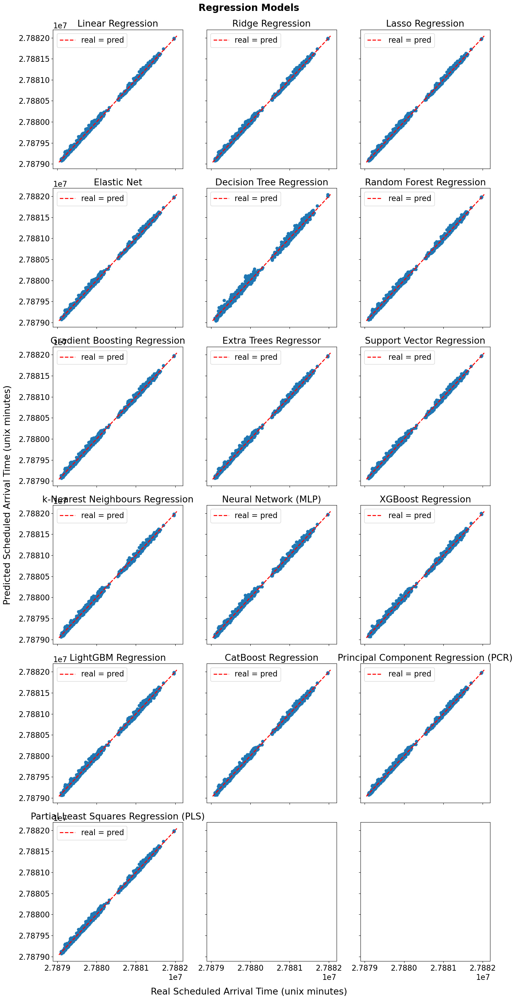

In [31]:
models = [
    'Linear Regression', 'Ridge Regression', 'Lasso Regression', 'Elastic Net',
    'Decision Tree Regression', 'Random Forest Regression',
    'Gradient Boosting Regression', 'Extra Trees Regressor',
    'Support Vector Regression', 'k-Nearest Neighbours Regression',
    'Neural Network (MLP)', 'XGBoost Regression', 'LightGBM Regression',
    'CatBoost Regression', 'Principal Component Regression (PCR)',
    'Partial Least Squares Regression (PLS)'
]

test_index = X_test_real.index
real_sched = ground_truth.loc[test_index]["Scheduled Arrival Time UTC"]

# Predicted Arrival ΔT (min) as np array
pred_arr_dT = np.array(predictions_6)
pred_sched = X_test_real["Actual Arrival Time UTC"].values + pred_arr_dT

evaluations = {}
for i in range(len(models)):
    rmse, mae, r2 = errors(real_sched, pred_sched[i])
    evaluations[models[i]] = {
        "rmse{}".format(""): rmse,
        "mae{}".format(""): mae,
        "r2{}".format(""): r2
    }

target_column = "Scheduled Arrival Time (unix minutes)"
print_predictive_score(evaluations,
                       target_column,
                       print_table=True,
                       return_df=False)
plot_scatter(real_sched, pred_sched, evaluations, target_column)

#### ``Departure ΔT (min)``

- **Load real and synthetic**
- **For all features ( do not exclude calculated features).**

In [32]:
# Load
real = pd.read_pickle(
    '../data/uc6_outputs/real_vs_synth/real_GC_durations_2.pkl')
synthetic = pd.read_pickle(
    '../data/uc6_outputs/real_vs_synth/synthetic_GC_durations_2.pkl')
#==============================================================================
# Removing invalid routs before predictions
print("Removing {} routs that are not in the real data.".format(
    synthetic[synthetic["Distance (miles)"].isna()].shape[0]))
synthetic = synthetic.dropna(subset=["Distance (miles)"])
#==============================================================================
# Remove rare flights delayed more than 2 hours
threshold = 120
print("Removing {} flights from real data (Arrival Delay > 2h).".format(
    real[real["Arrival ΔT (min)"] > threshold].shape[0]))
print("Removing {} flights from synthetic data (Arrival Delay > 2h).".format(
    synthetic[synthetic["Arrival ΔT (min)"] > threshold].shape[0]))
real = real[real["Arrival ΔT (min)"] <= threshold]
synthetic = synthetic[synthetic["Arrival ΔT (min)"] <= threshold]

print("Removing {} flights from real data (Departure Delay > 2h).".format(
    real[real["Departure ΔT (min)"] > threshold].shape[0]))
print("Removing {} flights from synthetic data (Departure Delay > 2h).".format(
    synthetic[synthetic["Departure ΔT (min)"] > threshold].shape[0]))
real = real[real["Departure ΔT (min)"] <= threshold]
synthetic = synthetic[synthetic["Departure ΔT (min)"] <= threshold]

Removing 2586 routs that are not in the real data.
Removing 304 flights from real data (Arrival Delay > 2h).
Removing 135 flights from synthetic data (Arrival Delay > 2h).
Removing 34 flights from real data (Departure Delay > 2h).
Removing 85 flights from synthetic data (Departure Delay > 2h).


**Encode non-numeric features:**

In [33]:
# Encode categorical
categorical_columns = [
    "Unique Carrier Code", "Tail Number", "ICAO Origin Airport",
    "ICAO Destination Airport"
]
# 1. ordinal encoding (to handel unseen categories)
ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value',
                                 unknown_value=-1)
for col in categorical_columns:
    # Fit the encoder on real data (reshape column to 2D)
    real[col] = ordinal_encoder.fit_transform(real[[col]])
    # Transform the synthetic dataset using the same encoding
    synthetic[col] = ordinal_encoder.transform(synthetic[[col]])
#==============================================================================
# Encode datetime (convert timestamps to minutes since the Unix epoch)
datetime_columns = [
    "Scheduled Departure Time UTC", "Actual Departure Time UTC",
    "Wheels Off Time UTC", "Wheels On Time UTC", "Scheduled Arrival Time UTC",
    "Actual Arrival Time UTC"
]
# Convert to minutes same as duration features
for col in datetime_columns:
    real[col] = pd.to_datetime(
        real[col]).dt.tz_convert(None).astype('int64') // 10**9 // 60
    synthetic[col] = pd.to_datetime(
        synthetic[col]).dt.tz_convert(None).astype('int64') // 10**9 // 60
#==============================================================================
remove = [
    "Origin Airport ID", "Origin City", "Origin State Code",
    "Origin State Name", "Destination Airport ID", "Destination City",
    "Destination State Code", "Destination State Name",
    "Scheduled Departure Time UTC", "Departure Delay Label",
    "Scheduled Arrival Time UTC", "Arrival Delay Label",
    "Scheduled Elapsed Time (min)"
]

ground_truth = real[[
    "Scheduled Arrival Time UTC",
    "Actual Arrival Time UTC",
    "Arrival ΔT (min)",
    "Arrival Delay Label",
    "Scheduled Departure Time UTC",
    "Actual Departure Time UTC",
    "Departure ΔT (min)",
    "Departure Delay Label",
]]

real = real.drop(columns=remove)
synthetic = synthetic.drop(columns=remove)
#==============================================================================
# Check for non_ numeric columns
print("Non-numeric columns in real data: ",
      real.select_dtypes(exclude=[np.number]).columns.tolist())
print("Non-numeric columns in synthetic data: ",
      synthetic.select_dtypes(exclude=[np.number]).columns.tolist())

Non-numeric columns in real data:  []
Non-numeric columns in synthetic data:  []


**Training/testing datasets:**

In [34]:
cols_to_drop = ["Departure ΔT (min)", "Arrival ΔT (min)"]
target_column = "Departure ΔT (min)"

# Real
X_train_real, X_test_real, Y_train_real, Y_test_real = split_data(
    real, test_size=0.2, random_state=42)

# Synthetic
X_train_synthetic = synthetic.drop(columns=cols_to_drop)
Y_train_synthetic = synthetic[target_column]

**Experiment_1 (TRTR)**

In [35]:
predictions_7, evaluations_7 = regressions(X_train_real, X_test_real,
                                           Y_train_real, Y_test_real)


Predicting "Departure ΔT (min)"

+----+----------------------------------------+---------+---------+------------+
|    | Model                                  |    RMSE |     MAE |         R2 |
+====+========================================+=========+=========+============+
|  1 | Linear Regression                      | 25.926  | 21.0001 | -0.0983475 |
+----+----------------------------------------+---------+---------+------------+
|  2 | Ridge Regression                       | 25.9262 | 21.0004 | -0.0983635 |
+----+----------------------------------------+---------+---------+------------+
|  3 | Lasso Regression                       | 25.5448 | 20.4464 | -0.0662867 |
+----+----------------------------------------+---------+---------+------------+
|  4 | Elastic Net                            | 25.556  | 20.4495 | -0.0672223 |
+----+----------------------------------------+---------+---------+------------+
|  5 | Decision Tree Regression               | 47.2295 | 34.9089 | -2.645 

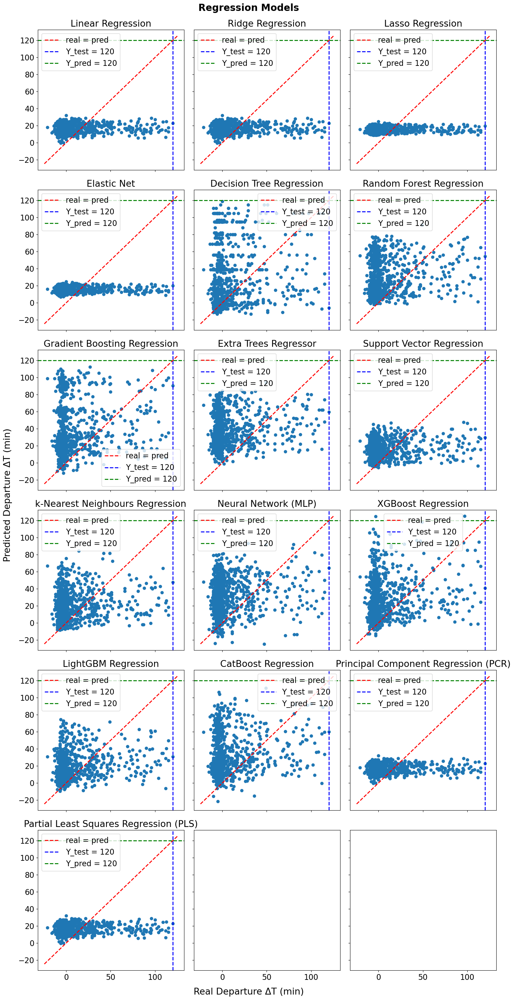

In [36]:
target_column = "Departure ΔT (min)"
print_predictive_score(evaluations_7,
                       target_column,
                       print_table=True,
                       return_df=False)

predictions_7[-1] = predictions_7[-1].flatten()
plot_scatter(Y_test_real,
             predictions_7,
             evaluations_7,
             target_column,
             lines=True)

**Error ``Scheduled Departure Time UTC``**

Before we calculated the error for the ***predicted*** ``Departure ΔT (min)``, now we calculate:
* ***calculated*** ``Scheduled Departure Time UTC`` = ***real*** ``Actual Departure Time UTC`` + ***predicted*** ``Departure ΔT (min)``
* Then we compare ***real*** vs ***calculated*** ``Scheduled Departure Time UTC``.



Predicting "Scheduled Departure Time (unix minutes)"

+----+----------------------------------------+---------+---------+----------+
|    | Model                                  |    RMSE |     MAE |       R2 |
+====+========================================+=========+=========+==========+
|  1 | Linear Regression                      | 35.3596 | 24.0611 | 0.997672 |
+----+----------------------------------------+---------+---------+----------+
|  2 | Ridge Regression                       | 35.3591 | 24.0613 | 0.997672 |
+----+----------------------------------------+---------+---------+----------+
|  3 | Lasso Regression                       | 34.0874 | 22.851  | 0.997837 |
+----+----------------------------------------+---------+---------+----------+
|  4 | Elastic Net                            | 34.159  | 22.8947 | 0.997827 |
+----+----------------------------------------+---------+---------+----------+
|  5 | Decision Tree Regression               | 59.3794 | 42.8574 | 0.993435

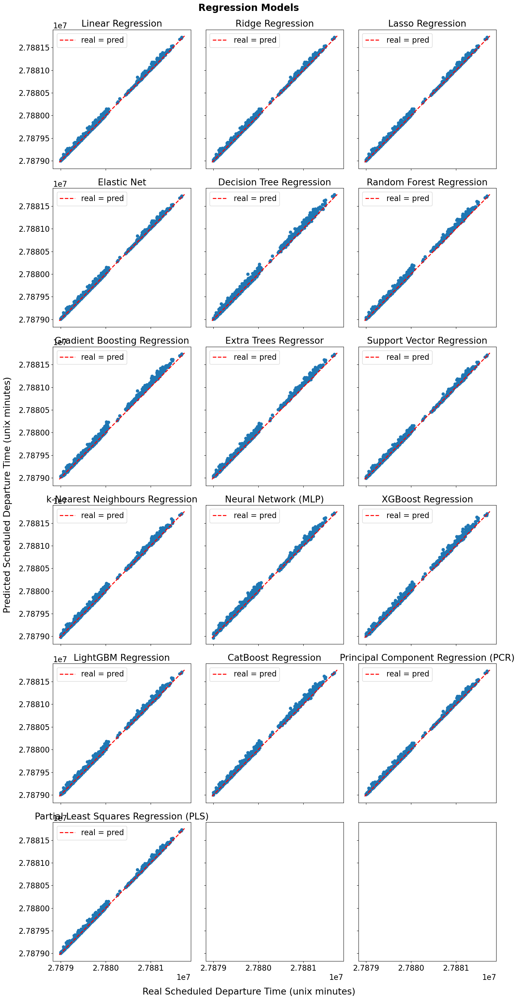

In [37]:
models = [
    'Linear Regression', 'Ridge Regression', 'Lasso Regression', 'Elastic Net',
    'Decision Tree Regression', 'Random Forest Regression',
    'Gradient Boosting Regression', 'Extra Trees Regressor',
    'Support Vector Regression', 'k-Nearest Neighbours Regression',
    'Neural Network (MLP)', 'XGBoost Regression', 'LightGBM Regression',
    'CatBoost Regression', 'Principal Component Regression (PCR)',
    'Partial Least Squares Regression (PLS)'
]

test_index = X_test_real.index
real_sched = ground_truth.loc[test_index]["Scheduled Departure Time UTC"]

# Predicted Departure ΔT (min) as np array
pred_dep_dT = np.array(predictions_7)
pred_sched = X_test_real["Actual Departure Time UTC"].values + pred_dep_dT

evaluations = {}
for i in range(len(models)):
    rmse, mae, r2 = errors(real_sched, pred_sched[i])
    evaluations[models[i]] = {
        "rmse{}".format(""): rmse,
        "mae{}".format(""): mae,
        "r2{}".format(""): r2
    }

target_column = "Scheduled Departure Time (unix minutes)"
print_predictive_score(evaluations,
                       target_column,
                       print_table=True,
                       return_df=False)
plot_scatter(real_sched, pred_sched, evaluations, target_column)

**Experiment_2 (TSTR)**

In [38]:
predictions_8, evaluations_8 = regressions(X_train_synthetic, X_test_real,
                                           Y_train_synthetic, Y_test_real)


Predicting "Departure ΔT (min)"

+----+----------------------------------------+---------+---------+-------------+
|    | Model                                  |    RMSE |     MAE |          R2 |
+====+========================================+=========+=========+=============+
|  1 | Linear Regression                      | 24.9489 | 18.4693 | -0.0171223  |
+----+----------------------------------------+---------+---------+-------------+
|  2 | Ridge Regression                       | 24.9485 | 18.4684 | -0.0170887  |
+----+----------------------------------------+---------+---------+-------------+
|  3 | Lasso Regression                       | 24.7808 | 18.0328 | -0.00346092 |
+----+----------------------------------------+---------+---------+-------------+
|  4 | Elastic Net                            | 24.7825 | 18.1873 | -0.00359801 |
+----+----------------------------------------+---------+---------+-------------+
|  5 | Decision Tree Regression               | 38.2964 | 27.861

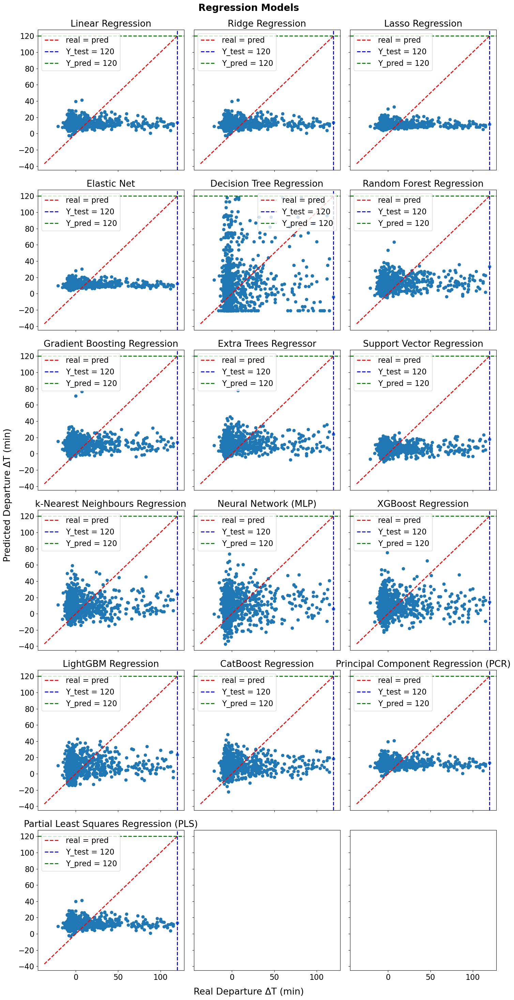

In [39]:
target_column = "Departure ΔT (min)"
print_predictive_score(evaluations_8,
                       target_column,
                       print_table=True,
                       return_df=False)

predictions_8[-1] = predictions_8[-1].flatten()
plot_scatter(Y_test_real,
             predictions_8,
             evaluations_8,
             target_column,
             lines=True)

**Error ``Scheduled Departure Time UTC``**

Before we calculated the error for the ***predicted*** ``Departure ΔT (min)``, now we calculate:
* ***calculated*** ``Scheduled Departure Time UTC`` = ***real*** ``Actual Departure Time UTC`` + ***predicted*** ``Departure ΔT (min)``
* Then we compare ***real*** vs ***calculated*** ``Scheduled Departure Time UTC``.



Predicting "Scheduled Departure Time (unix minutes)"

+----+----------------------------------------+---------+---------+----------+
|    | Model                                  |    RMSE |     MAE |       R2 |
+====+========================================+=========+=========+==========+
|  1 | Linear Regression                      | 32.2661 | 19.9049 | 0.998062 |
+----+----------------------------------------+---------+---------+----------+
|  2 | Ridge Regression                       | 32.2647 | 19.9032 | 0.998062 |
+----+----------------------------------------+---------+---------+----------+
|  3 | Lasso Regression                       | 31.27   | 18.7337 | 0.998179 |
+----+----------------------------------------+---------+---------+----------+
|  4 | Elastic Net                            | 31.4283 | 18.9783 | 0.998161 |
+----+----------------------------------------+---------+---------+----------+
|  5 | Decision Tree Regression               | 45.5478 | 31.463  | 0.996137

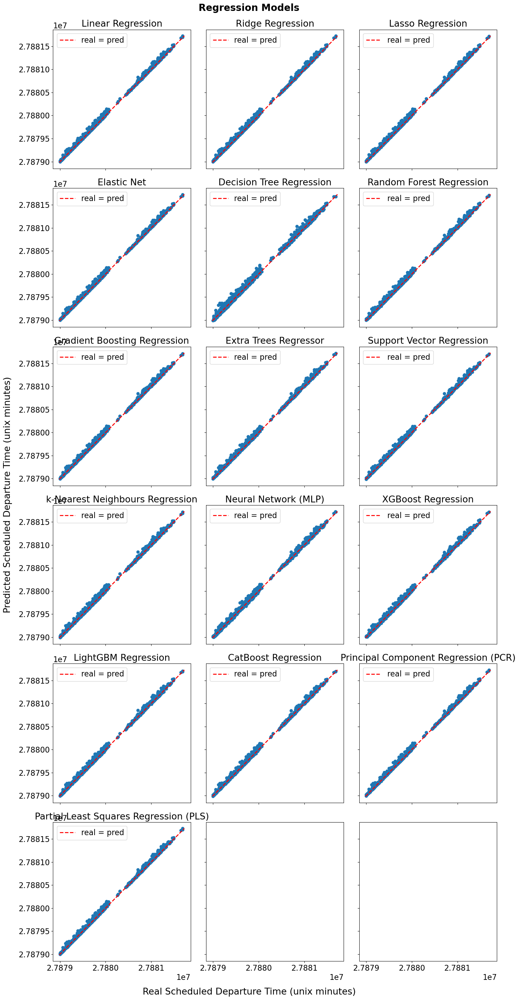

In [40]:
models = [
    'Linear Regression', 'Ridge Regression', 'Lasso Regression', 'Elastic Net',
    'Decision Tree Regression', 'Random Forest Regression',
    'Gradient Boosting Regression', 'Extra Trees Regressor',
    'Support Vector Regression', 'k-Nearest Neighbours Regression',
    'Neural Network (MLP)', 'XGBoost Regression', 'LightGBM Regression',
    'CatBoost Regression', 'Principal Component Regression (PCR)',
    'Partial Least Squares Regression (PLS)'
]

test_index = X_test_real.index
real_sched = ground_truth.loc[test_index]["Scheduled Departure Time UTC"]

# Predicted Departure ΔT (min) as np array
pred_dep_dT = np.array(predictions_8)
pred_sched = X_test_real["Actual Departure Time UTC"].values + pred_dep_dT

evaluations = {}
for i in range(len(models)):
    rmse, mae, r2 = errors(real_sched, pred_sched[i])
    evaluations[models[i]] = {
        "rmse{}".format(""): rmse,
        "mae{}".format(""): mae,
        "r2{}".format(""): r2
    }

target_column = "Scheduled Departure Time (unix minutes)"
print_predictive_score(evaluations,
                       target_column,
                       print_table=True,
                       return_df=False)
plot_scatter(real_sched, pred_sched, evaluations, target_column)

**Save evaluations for comparison:**

In [41]:
# Saving the dictionary to a file
with open(
        '../data/uc6_outputs/predictive_score/predictive_score_GC_trtr_Rem2h_ArrivalDelay.pkl',
        'wb') as f:
    pickle.dump(evaluations_5, f)
with open(
        '../data/uc6_outputs/predictive_score/predictive_score_GC_tstr_Rem2h_ArrivalDelay.pkl',
        'wb') as f:
    pickle.dump(evaluations_6, f)
with open(
        '../data/uc6_outputs/predictive_score/predictive_score_GC_trtr_Rem2h_DepartureDelay.pkl',
        'wb') as f:
    pickle.dump(evaluations_7, f)
with open(
        '../data/uc6_outputs/predictive_score/predictive_score_GC_tstr_Rem2h_DepartureDelay.pkl',
        'wb') as f:
    pickle.dump(evaluations_8, f)